# <center> **Text mining project** </center>
## <center> -Scientific papers clustering- </center>

## **I.Introduction**

In this project, we will classify scientific papers using unsupervised clustering methods : K-Means and its variant Spherical K-Means. We will then try to interpret our results once we obtain mathematically significant clusters, based on intra-variance analysis.

*Everything starts with data processing.*  
- We will start by importing the necessary libraries and proceed to data reading and processing.

#### **1. Dependencies installation & libraries import**

In [ ]:
### Installing dependencies
!pip install spacy
!python -m spacy download en_core_web_sm

In [ ]:
!pip install spacy-transformers
!pip install spacy-entity-linker
!python -m spacy_entity_linker "download_knowledge_base"

In [ ]:
!pip install coclust
!pip install scipy

In [ ]:
#### Installing stopwords, wordnet & coclust
import nltk
nltk.download('stopwords')
nltk.download('wordnet')

In [ ]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import re
import plotly.express as px
import plotly.graph_objects as go
import spacy
import operator
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from functools import reduce
from coclust.clustering.spherical_kmeans import SphericalKmeans 
from scipy import sparse
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np
from wordcloud import WordCloud
from  sklearn.preprocessing import normalize

#### **2. Data Reading**

Our data is saved in a text file containing articles informations. Articles are separated by `\n\n`.  
Each paper has the following structure :

**\#*[paper Title]  
\#@[Authors separated by `\n`]  
\#t[Year]  
\#c[Publication venue]  
\#index[id of the paper]  
\#%[id of a revue that referenced this one] (if many references: each one is declared individually)  
\#![Abstract]**

each variable `[ ]` is subsituted by its value according to the review it represents.

###### **a. Reading and splitting revues**

First, let's load the content of the text file :


We will then split the content of the file according to a double line separator before saving the articles in a list :

In [ ]:
articles = []

document_count = 0

with open('DBLP_Subset.txt', 'r') as f:
  for line in f:
    # Article separator (line='\n')
    if(line == '\n'):
      document_count += 1
      continue 
    # lines of an article (2 to len(article_infos))
    if document_count < len(articles):
      articles[document_count] += line
    # First line of an article
    else:
      articles.append(line)


###### **b. Checking if reading was successful**

In [ ]:
print('Number of articles : %d' % len(articles))
print('\n-------------------------------------------------------------------------\n')
print(articles[0])
print('\n-------------------------------------------------------------------------\n')
print(articles[-1])

Number of articles : 37966

-------------------------------------------------------------------------

#*Improved Channel Routing by Via Minimization and Shifting.
#@Chung-Kuan Cheng
David N. Deutsch
#t1988
#cDAC
#index131751
#%133716
#%133521
#%134343
#!Channel routing area improvement by means of via minimization and via shifting in two dimensions (compaction) is readily achievable. Routing feature area can be minimized by wire straightening. The implementation of algorithms for each of these procedures has produced a solution for Deutsch's Difficult Example
 the standard channel routing benchmark
 that is more than 5% smaller than the best result published heretofore. Suggestions for possible future work are also given.


-------------------------------------------------------------------------

#*GLBM: A new QoS aware multicast scheme for wireless mesh networks.
#@Liang Zhao
Ahmed Yassin Al-Dubai
Geyong Min
#t2010
#cJournal of Systems and Software
#index1600541
#%793240
#%506314
#%

Articles separation is a success. However, we observe that authors may either be separated with `\n` or `,`. We will thus take this variation into consideration when parsing the articles.

## **II. Data Processing**

#### **1. Data Parsing**

Since each paper attribute starts with a `#`, we will start by splitting our brute text by `\n#`. We chose to split with `\n#` rather than `#` because we observed that `#` is sometimes included in articles abstracts.


In [ ]:
def split_article(text):
  splitted = text.split('\n#')

  # This line is for removing "#" from the article title
  splitted[0] = splitted[0].split('#')[1] 

  return splitted

Here is an example of splitting the first article of the dataset :

In [ ]:
split_article(articles[0])

['*Improved Channel Routing by Via Minimization and Shifting.',
 '@Chung-Kuan Cheng\nDavid N. Deutsch',
 't1988',
 'cDAC',
 'index131751',
 '%133716',
 '%133521',
 '%134343',
 "!Channel routing area improvement by means of via minimization and via shifting in two dimensions (compaction) is readily achievable. Routing feature area can be minimized by wire straightening. The implementation of algorithms for each of these procedures has produced a solution for Deutsch's Difficult Example\n the standard channel routing benchmark\n that is more than 5% smaller than the best result published heretofore. Suggestions for possible future work are also given.\n"]

Next we will iterate over each article attribute to identify its nature. The result will be saved in a dictionary. But first, let's define a function for identifying attributes type :

In [ ]:
def get_line_type(line):
  line_types = {
      '*': 'title',
      '@': 'authors',
      't': 'year',
      'c': 'pub_venue',
      '%': 'reference',
      '!': 'abstract'
  }

  if not line[0] in line_types:
    return False
  
  return line_types[line[0]]

def is_index(line):
  return line[:5] == 'index'

Apart from authors and reference, every attribute's value is the line minus the first character which was used as a way of mapping the values to their attributes.

References parsing will be slightly different because each reference is defined in a line with its own mapping characters `#%`. We will simply be stocking them into a list.

However, the structure of authors has two variations:
- Separated by `,`
- Separated by `\n` 

We will first strip the line to delete the `\n` at the end of the line, then we will simply split by both `\n` and/or `,`. In our case, the pattern indicates that `,` and `\n` can't appear in the same enumeration of an article authors. 

In [ ]:
def get_authors(line):
  return [author.strip() for author in re.split('\n|,',line)]

Now, we can define a function that returns a dictionary mapping the attribute values in the text format to their names.

In [ ]:
def map_attributes(text):
    try:
       values = split_article(text)
    except:
        return {'refs_count': np.nan, 
                'references': np.nan,
                'title': np.nan, 
                'authors': np.nan, 
                'year': np.nan, 
                'pub_venue': np.nan, 
                'index': np.nan, 
                'abstract': np.nan}

    mapping = {
        'refs_count': 0,
        'references': [],
        'title': np.nan, 
        'authors': np.nan, 
        'year': np.nan, 
        'pub_venue': np.nan, 
        'index': np.nan, 
        'abstract': np.nan
    }
  
    for value in values:
      x = value[1:].strip()
      
      if is_index(value):
        mapping['index'] = x[4:]
        continue
      
      line_type = get_line_type(value)

      if line_type == 'authors':
        mapping['authors'] = get_authors(x)
        continue 
      
      if line_type == 'reference':
        mapping['refs_count'] += 1
        mapping['references'].append(x)
        continue 

      if not line_type:
        continue 
      
      mapping[line_type] = x

    return mapping

Let's check once again the first and last review informations but this time each attribute is explicitly mapped to its name.

In [ ]:
print(map_attributes(articles[0]))
print(map_attributes(articles[-1]))

{'refs_count': 3, 'references': ['133716', '133521', '134343'], 'title': 'Improved Channel Routing by Via Minimization and Shifting.', 'authors': ['Chung-Kuan Cheng', 'David N. Deutsch'], 'year': '1988', 'pub_venue': 'DAC', 'index': '131751', 'abstract': "Channel routing area improvement by means of via minimization and via shifting in two dimensions (compaction) is readily achievable. Routing feature area can be minimized by wire straightening. The implementation of algorithms for each of these procedures has produced a solution for Deutsch's Difficult Example\n the standard channel routing benchmark\n that is more than 5% smaller than the best result published heretofore. Suggestions for possible future work are also given."}
{'refs_count': 10, 'references': ['793240', '506314', '803044', '609215', '803091', '505759', '432741', '718325', '482418', '1247773'], 'title': 'GLBM: A new QoS aware multicast scheme for wireless mesh networks.', 'authors': ['Liang Zhao', 'Ahmed Yassin Al-Duba

#### **2. Dataframe creation**

First, let's create a Dataframe with a single colum containing the revues in their brute form.

In [ ]:
df = pd.DataFrame({'article':articles})
print('data size is: %s' % str(df.shape))
df.head()

data size is: (37966, 1)


,article
0,#*Improved Channel Routing by Via Minimization...
1,#*A fast simultaneous input vector generation ...
2,#*On the Over-Specification Problem in Sequent...
3,#*Device and architecture co-optimization for ...
4,#*Differential Fault Simulation - a Fast Metho...


Then we can map the function `map_attributes` on every single row, which will generate a dataframe based on each row as a dictionary.

In [ ]:
data_parsed = df.apply(lambda row: map_attributes(row.values[0]), axis=1, result_type='expand')

In [ ]:
data_parsed.head()

,refs_count,references,title,authors,year,pub_venue,index,abstract
0,3.0,"[133716, 133521, 134343]",Improved Channel Routing by Via Minimization a...,"[Chung-Kuan Cheng, David N. Deutsch]",1988,DAC,131751,Channel routing area improvement by means of v...
1,8.0,"[132550, 530568, 436486, 134259, 283007, 13442...",A fast simultaneous input vector generation an...,"[Lei Cheng, Liang Deng, Deming Chen, Martin D....",2006,DAC,131752,Input vector control (IVC) technique is based ...
2,3.0,"[455537, 1078626, 131745]",On the Over-Specification Problem in Sequentia...,"[Kwang-Ting Cheng, Hi-Keung Tony Ma]",1992,DAC,131756,The authors show that some ATPG (automatic tes...
3,7.0,"[214244, 215701, 214503, 282575, 214411, 21450...",Device and architecture co-optimization for FP...,"[Lerong Cheng, Phoebe Wong, Fei Li, Yan Lin, L...",2005,DAC,131759,Device optimization considering supply voltage...
4,2.0,"[131744, 806030]",Differential Fault Simulation - a Fast Method ...,"[Wu-Tung Cheng, Meng-Lin Yu]",1989,DAC,131760,A new\n fast fault simulator called differenti...


#### **3. Missing values analysis**

First, we need to have a clue about missing values in our dataset : 

In [ ]:
pd.isna(data_parsed).sum()

refs_count        3
references        3
title             3
authors           3
year              3
pub_venue         3
index             3
abstract      17409
dtype: int64

We can clearly see that we have $17409$ articles with a missing abstract. Those articles are considered irrelevant in our case since the abstract is the most important feature in the dataset. However, they represent about $46\%$ of our dataset.

Let's remove them using pandas : 


In [ ]:
# Remove null abstracts
data_parsed = data_parsed.dropna(subset=['abstract'])
data_parsed.shape

(20557, 8)

Let's double check if there are any missing values after removing articles with null abstracts : 

In [ ]:
pd.isna(data_parsed).sum()

refs_count    0
references    0
title         0
authors       0
year          0
pub_venue     0
index         0
abstract      0
dtype: int64

We can clearly see that we don't have any missing values now.

#### **4. Analysis according to scientific journals**
In this section we want to count how many articles are published in each scientific journal.

In [ ]:
unique_journals = data_parsed['pub_venue'].unique()

print('Number of unique journals : %d' % len(unique_journals))

Number of unique journals : 121


We have $121$ unique scientific journals in our dataset.

Let's count now the number of articles for each journal : 

In [ ]:
data_parsed['pub_venue'].value_counts()

DAC                                                        2184
IJCAI                                                      2065
Electr. Notes Theor. Comput. Sci.                          1948
SIGMOD Conference                                          1689
ICCAD                                                      1666
                                                           ... 
Web Information Retrieval and Linear Algebra Algorithms       1
ICIP (3)                                                      1
Perspektiven der Informatik                                   1
ICCC                                                          1
Informatica Didactica                                         1
Name: pub_venue, Length: 121, dtype: int64

Since our label is the `pub_venue` column, we want to remove scientific journals that have less than 50 published articles : 

In [ ]:
data_parsed = data_parsed[data_parsed.groupby('pub_venue').pub_venue.transform('count') > 50]

Let's check if we have successfully applied the previous filter : 

In [ ]:
data_parsed['pub_venue'].value_counts()

DAC                                                2184
IJCAI                                              2065
Electr. Notes Theor. Comput. Sci.                  1948
SIGMOD Conference                                  1689
ICCAD                                              1666
GECCO                                              1472
Discrete Applied Mathematics                       1442
Journal of Systems and Software                     936
Des. Codes Cryptography                             816
ICIP                                                812
ICC                                                 587
SIGMOD Record                                       510
SMC                                                 445
DATA BASE                                           324
Discrete & Computational Geometry                   307
GECCO (Companion)                                   269
Data Min. Knowl. Discov.                            242
Distributed Computing                           

We can clearly see that we have only journals with more than $50$ published articles.

In [ ]:
data_parsed.reset_index(drop=True, inplace=True)
data_parsed.shape

(19546, 8)

#### **5. Abstracts processing**

In this section, we want to clean abstracts by removing stopwords, punctuation, numbers & digits, links...

Let's define the following function for cleaning texts :


In [ ]:
# Get stop words from nltk package 
stop_words = stopwords.words('english')
lemmatizer = WordNetLemmatizer()

def clean_text(
        string: str,
        punctuation=r'''!()-[]{};:'"\,<>./?@#$%^*_~''',
        stop_words=stop_words
) -> str:
    # Cleaning URLs
    string = re.sub(r'https?://\S+|www\.S+', '', string)

    # Deleting HTML elements
    string = re.sub(r'<.*?>', '', string)

    # Deleting numbers
    string = re.sub(r'[0-9]+', '', string)

    # Removing punctuation
    for x in string.lower():
        if x in punctuation:
            string = string.replace(x, "")

    # Perform lemmatization & remove stop words
    string = string.lower()
    string = ' '.join([lemmatizer.lemmatize(word) for word in string.split() if word not in stop_words])
    string = re.sub(r'\s+', ' ', string).strip()

    return string

Next, let's get our abstracts and clean them : 

In [ ]:
abstracts = data_parsed['abstract'].tolist()

processed_abstracts = [clean_text(abstract) for abstract in abstracts]

print('Number of processed abstracts : %d' % len(processed_abstracts))

Number of processed abstracts : 19546


The list of processed abstracts contains exactly the number of rows of our processed dataframe. Let's check the first processed abstract in order to be sure that our `clean_text` function works correctly : 

In [ ]:
processed_abstracts[0]

'channel routing area improvement mean via minimization via shifting two dimension compaction readily achievable routing feature area minimized wire straightening implementation algorithm procedure produced solution deutschs difficult example standard channel routing benchmark smaller best result published heretofore suggestion possible future work also given'

#### **6. Bag of Words representation of abstracts**

In this section, we want to construct a BoW representation of abstracts. This can be done easily using scikit learn's `CountVectorizer` object :

In [ ]:
vectorizer = CountVectorizer()
bow_abstracts = vectorizer.fit_transform(processed_abstracts)

In [ ]:
print('BoW size: ', bow_abstracts.shape)
print(vectorizer.get_feature_names()[:5])

BoW size:  (19546, 55729)
['aa', 'aaa', 'aaaauthentication', 'aaah', 'aaahhome']


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



#### **7. Named entity linking (NED) of abstracts**

We want to build a document-entity matrix representation for abstracts but first, we need to retrieve entities for each abstract in our dataset.

First, let's fill, for each document, a list of entities : 



In [ ]:
nlp = spacy.load('en_core_web_sm')
nlp.add_pipe('entityLinker', last=True)

entitiesList = []
entitiesWords = {}
for counter, abstract in enumerate(processed_abstracts):
  doc = nlp(str(abstract))

  abstract_entities = []

  for sentence in doc.sents:
    for entity in sentence._.linkedEntities:
      id = entity.get_id()
      entitiesWords[id] = entity.get_label()
      abstract_entities.append(id)
      
  entitiesList.append(abstract_entities)

In [ ]:
len(entitiesList)

19546

The length of the list corresponds to the number of documents. Next, we will collapse `entitiesList` into one single list named `allEntities` : 

In [ ]:
# Collapsing all entities into one list
allEntities = reduce(operator.concat, entitiesList)

Finally, we retrieve only unique entities and then we construct and compute the document-entities matrix by putting a $1$ if the entity is present in the document and $0$ otherwise.

In [ ]:
# Get unique entities
unique_entities = np.unique(allEntities)
unique_entities.shape

(14241,)

In [ ]:
# Constructing document-entities matrix 
nb_rows = len(entitiesList)
nb_columns = len(unique_entities)

docEntitiesMatrix = np.zeros((nb_rows, nb_columns))

# Computing the matrix
for i, document in enumerate(entitiesList):
  for index, entityId in enumerate(document):
    entity_index = np.where(unique_entities == entityId)[0][0]

    docEntitiesMatrix[i, entity_index] = 1

docEntitiesMatrix.shape

(19546, 14241)

#### **8. Document-Authors matrix construction**

In [ ]:
docAuthCorpus = data_parsed['authors'].map(lambda authors: '__'.join([author.strip() for author in authors]))
vectorizer_auth = CountVectorizer(tokenizer=lambda x: x.split('__'))
docAuthors = vectorizer_auth.fit_transform(docAuthCorpus.tolist())

In [ ]:
docAuthors.shape

(19546, 31748)

## **III. Data exploration**

#### **1. Productive authors**

To identify the productive authors, we need to base our analysis on these authors number of publications. Naturally, those with the highest number of publications are the most productive authors.  

Since out data contains publications from 31 756 different authors, we will start be analysing the distribution of the author's number of publications to get a hold on its distribution. 

In [ ]:
authors_prod = docAuthors.sum(0)

In [ ]:
fig = px.box(y = authors_prod.getA()[0])
fig.update_layout(
    title={"text": "Number of publications by author distribution", 'x':0.5},
    yaxis_title="number of publications",
)
fig.show()

We observe that 75% of the 31 748 authors have less or equal than 2 publications.  
Since the upper fence delimiting "extreme number of publications according to its distribution on this dataset" is equal to 3.  We can consider all the authors that have 4 publications or more as a productive author.

In [ ]:
print('Number of productive authors (more than 4 publications): %d' % (authors_prod >= 4).sum())
print('Number of extremely productive authors (more than 20 publications): %d' % (authors_prod >= 20).sum())

Number of productive authors (more than 4 publications): 2148
Number of extremely productive authors (more than 20 publications): 80


2148(~7%) authors have more than 4 publications.   
Let's rather visualize the 80 (0.25%) authors with more than 20 publications.

In [ ]:
fig = px.bar(x = np.array(vectorizer_auth.get_feature_names_out())[(authors_prod>=20).getA()[0]], 
             y = authors_prod[authors_prod>=20].getA()[0])

fig.update_layout(
    title={"text": "Number of publication of productive authors", 'x':0.5},
    xaxis_title="author",
    yaxis_title="number of publications",
)

fig.show()

#### **2. Popular articles and number of citations analysis**

Articles popularity is estimated based on the article's number of references. Let's start by analysing the distribution of number of references over our articles.

In [ ]:
fig = px.box(data_parsed, y ='refs_count')

fig.update_layout(
    title={"text": "Number of references distribution", 'x':0.5},
    yaxis_title="number of references",
)

fig.show()

We observe that 75% of the 19 546 articles have less or equal than 9 citations.  
Since the upper fence delimiting "extreme number of citations according to its distribution on this dataset" is equal to 19.  We can consider all the articles that have 40 citations or more as a popular article.

In [ ]:
fig = px.bar(pd.DataFrame({'title' : data_parsed['title'][data_parsed['refs_count']>=40], 
                           'number of citations' : data_parsed['refs_count'][data_parsed['refs_count']>=40],
                           'article': data_parsed['refs_count'][data_parsed['refs_count']>=40].index}),
             x = 'article',
             y = 'number of citations',
             hover_data = ['title'])

fig.update_xaxes(type='category')

fig.update_layout(
    title={"text": "number of citations of popular articles", 'x':0.5},
    xaxis_title="articles",
    yaxis_title="number of citations",
)

fig.show()

#### **3. Productive years** 

In [ ]:
years_pub = data_parsed.groupby('year').apply(len).reset_index()
years_pub.columns = ['year', 'number of publications']

In [ ]:
fig = px.box(years_pub, y ='number of publications')

fig.update_layout(
    title={"text": "Number of publications per year distribution", 'x':0.5},

)


We observe that 75% of the years have less than 890 publications where the maximum number of publications per year is 3627!

In [ ]:
fig = px.area(years_pub, x='year', y='number of publications')

fig.update_layout(
    title={"text": "Number of publications per year", 'x':0.5},

)

We observe that the number of publications increased over time especially since the 90's.  
Our data is limited to 2009. Since 2010 is the last year available in our data and its number of publications is very low, we will assume that 2010's data isn't complete.  
The highest number of publications was achieved in 2009, the last year where we have data which means that the number of publications was surely still increasing after 2009.

#### **4. Number of articles per publication venue**

In [ ]:
pub_articles = data_parsed.groupby('pub_venue').apply(len).reset_index()
pub_articles.columns = ['venue', 'number of articles']

In [ ]:
fig = px.box(pub_articles, y = 'number of articles')

fig.update_layout(
    title={"text": "Number of articles per venue distribution", 'x':0.5},

)

We observe that this distribution have a low median of 238 article in a venue. The other half of the venues can be divided into two ***equal groups***:

*   Those with number of articles between 238 and 816.
*   Other with number of articles between 816 and 2184.

The more advanced venues are the upper 25% with a number of articles in [816, 2184]. Let's have a better look into this group.



In [ ]:
fig = px.bar(pub_articles[pub_articles['number of articles']>=816],
             x = 'venue',
             y = 'number of articles'
             )

fig.update_layout(
    title={"text": "number of articles per venue", 'x':0.5},
    xaxis_title="venue",
    yaxis_title="number of articles",
)

fig.show()

#### **5. Words frequency**

In [ ]:
words_freq = pd.DataFrame({'word': vectorizer.get_feature_names(),
                          'frequency': bow_abstracts.sum(axis=0).getA()[0]})

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [ ]:
fig = px.box(words_freq, 
             y = 'frequency',
             hover_data=['word'])

fig.update_layout(
    title={"text": "Words frequency", 'x':0.5},

)

First, half of the words have been used once over all the corpus. While the other 25% have been used 4 times at most.

In the other hand, we observe that many words (significant) have more than 8 appearances (the upper fence) and some of them have been used over 14 000 times in our corpus. 

Let's first start by visualizing the distribution without the very frequent words.

In [ ]:
fig = px.box(words_freq[words_freq['frequency']<=10], 
             y = 'frequency')

fig.update_layout(
    title={"text": "Words frequency [filter: n<=10]", 'x':0.5},

)

The frequency of the words have a very small variance with most of the words having less than 3 uses over the corpus.

## **IV.Clustering**

- Defining functions to choose number of clusters based on inertia and silhouette score.

In [ ]:
def silhouette(dtm, spherical = True, bow = False, nb = 15):
  sil_coeffs = []
  

  if bow:
    bow_pca = TruncatedSVD(n_components=300).fit_transform((normalize(dtm, norm='l1', axis=1)))
    bow_pca = sparse.csr_matrix(bow_pca)
    print(bow_pca.shape)
  else:
    sparse_dtm = sparse.csr_matrix(dtm)

  for k in range(2, nb):
    print(k) 
    # Model init
    if spherical:
      kmeans = SphericalKmeans(n_clusters=k, random_state=0)
    else:
      kmeans = KMeans(n_clusters=k, random_state=0)
    # Fitting model on data

    if bow:
      data = bow_pca
    else:
      data = sparse_dtm

    kmeans.fit(data)
    
    labels = kmeans.labels_
    # silhouette score
    sil_coeffs.append(silhouette_score(data, labels, metric='cosine'))
  
  return  sil_coeffs

def plot_silhouette(sil, nb = 15):
  
  f = plt.figure()
  #Silhouette score
  plt.plot(range(2, nb), sil)
  plt.title('The silhouette scriterion')
  plt.xlabel('Number of clusters')
  plt.ylabel('Silhouette score')
  
  plt.show()

#### **0. K-means on document-term matrix**

**a. Application**

In [ ]:
bow_csr_matrix = sparse.csr_matrix(bow_abstracts)

In [ ]:
kmeans = KMeans(n_clusters=34, random_state=0)
kmeans.fit(bow_csr_matrix)
labels = np.array(kmeans.labels_)

**b. Interpretation**

In [ ]:
from sklearn.manifold import TSNE
bow_csr_matrix = sparse.csr_matrix(bow_abstracts)
tsne = TSNE(n_components=2)
tsne_data = tsne.fit_transform(bow_csr_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [ ]:
fig= px.scatter(x=tsne_data[:, 0], y= tsne_data[:, 1],color=labels)

fig.show()

In [ ]:
from sklearn import preprocessing
lb = preprocessing.LabelEncoder()
True_labels = lb.fit_transform(list(data_parsed['pub_venue'].values))
labels_list = dict(zip(lb.classes_, lb.transform(lb.classes_)))
labels_list

{'DAC': 0,
 'DAGM-Symposium': 1,
 'DATA BASE': 2,
 'Data Min. Knowl. Discov.': 3,
 'Des. Codes Cryptography': 4,
 'Discrete & Computational Geometry': 5,
 'Discrete Applied Mathematics': 6,
 'Distributed Computing': 7,
 'Electr. Notes Theor. Comput. Sci.': 8,
 'GECCO': 9,
 'GECCO (Companion)': 10,
 'GECCO Workshops': 11,
 'ICC': 12,
 'ICCAD': 13,
 'ICCBR': 14,
 'ICCE': 15,
 'ICCSA (1)': 16,
 'ICCSA (2)': 17,
 'ICCSA (3)': 18,
 'ICCV': 19,
 'ICIP': 20,
 'IEEE Distributed Systems Online': 21,
 'IJCAI': 22,
 'IJCAI (1)': 23,
 'Journal of Systems and Software': 24,
 'Journal of Visualization and Computer Animation': 25,
 'Knowl. Inf. Syst.': 26,
 'SIGMOD Conference': 27,
 'SIGMOD Record': 28,
 'SMC': 29,
 'SNPD': 30,
 'STOC': 31,
 'VR': 32,
 'WETICE': 33}

- NMI and ARI scores 

In [ ]:
from sklearn.metrics import (adjusted_rand_score as ari,normalized_mutual_info_score as nmi)
def print_scores(labels, kmeans_labels):
  print(f"NMI = {nmi(labels, kmeans_labels)}")
  print(f"ARI = {ari(labels, kmeans_labels)}")

In [ ]:
print_scores(True_labels,labels)

NMI = 0.17967608437182822
ARI = 0.03417482697696328


- Most frequent words

The centers of each cluster from the document-term representation can be calculated through the mean of each cluster BOW representation. 

The most frequent entities in each cluster is equal to the words that have the highest value in centers BOW representations.

In [ ]:
centers = [np.array(bow_abstracts[labels == i].mean(0)) for i in range(34)]
i_center_words = [centers[i][0,:].argsort()[-1:-16:-1] for i in range(34)]
words = [[vectorizer.get_feature_names_out()[id] for id in L] for L in i_center_words]

In [ ]:
dicts = []
for i in range(34):
  d = {}
  for j in range(len(words[i])):
      d[words[i][j]] = centers[i][0, i_center_words[i][j]]
  dicts.append(d)

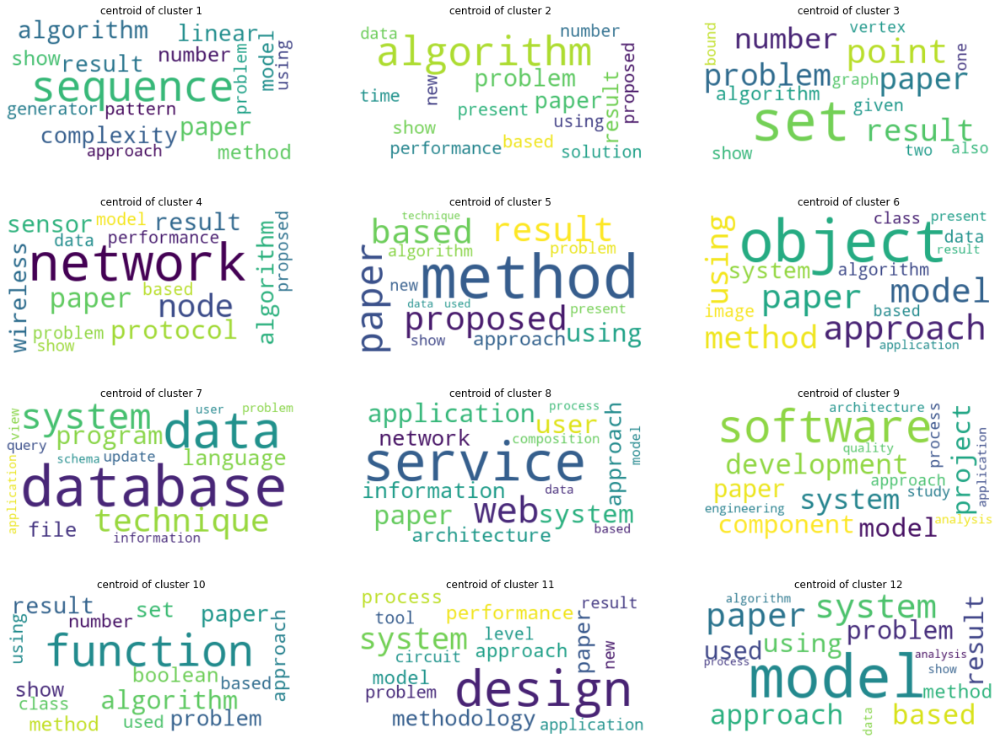

In [ ]:
f = plt.figure(figsize=(21, 16))

for i in range(12):
  wc = WordCloud(background_color="white").generate_from_frequencies(dicts[i])
  plt.subplot(4, 3, i+1)
  plt.imshow(wc, interpolation="bilinear")
  plt.axis("off")
  plt.title('centroid of cluster %d' % (i+1))

- Reviews type for each cluster:

In [ ]:
L = []
for i in range(34):
  L.append(data_parsed[labels==i].groupby('pub_venue').apply(len).sort_values(ascending=False)[:5])

In [ ]:

for i in range(10):
  fig = px.bar(x = L[i].index, 
              y = L[i])

  fig.update_layout(
      title={"text": "Cluster %d" % (i+1), 'x':0.5},
      xaxis_title="number of references",
      yaxis_title="number of articles",
  )

  fig.show()

- year distribution for each cluster:

In [ ]:
L = []
for i in range(34):
  L.append(data_parsed[labels==i].groupby('year').apply(len).sort_values(ascending=False)[:5])

In [ ]:
for i in range(34):
  fig = px.bar(x = L[i].index, 
              y = L[i])

  fig.update_layout(
      title={"text": "Cluster %d" % (i+1), 'x':0.5},
      xaxis_title="number of references",
      yaxis_title="number of articles",
  )

  fig.show()

- year distribution for each cluster:

In [ ]:
L = []
for i in range(34):
  L.append(data_parsed[labels==i].groupby('refs_count').apply(len).sort_values(ascending=False))

In [ ]:
for i in range(34):
  fig = px.bar(x = L[i].index, 
              y = L[i])

  fig.update_layout(
      title={"text": "Cluster %d" % (i+1), 'x':0.5},
      xaxis_title="number of references",
      yaxis_title="number of articles",
  )

  fig.show()

In [ ]:
sil = silhouette(bow_csr_matrix, spherical = False, bow = True, nb =40)

(19546, 300)
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


KeyboardInterrupt: ignored

From the previous results we can observe that :
  - Many clusters contains a lot of articles from different pub_venues
  - From the silhouette function the best number of cluster is (since it's unsuperevised learning )

So we try to regroup the documents by theme.


In [ ]:
kmeans = KMeans(n_clusters=8, random_state=0)
kmeans.fit(bow_csr_matrix)
labels = np.array(kmeans.labels_)

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2)
tsne_data = tsne.fit_transform(bow_csr_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [ ]:
fig= px.scatter(x=tsne_data[:, 0], y= tsne_data[:, 1],color=labels)

fig.show()

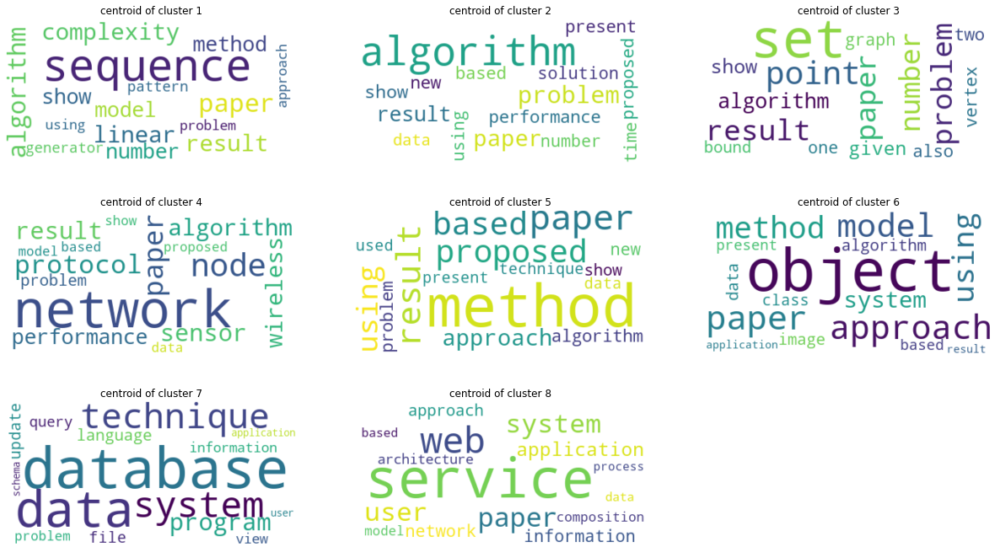

In [ ]:
f = plt.figure(figsize=(21, 16))

for i in range(8):
  wc = WordCloud(background_color="white").generate_from_frequencies(dicts[i])
  plt.subplot(4, 3, i+1)
  plt.imshow(wc, interpolation="bilinear")
  plt.axis("off")
  plt.title('centroid of cluster %d' % (i+1))

#### **1. Spherical-K-means on document-term matrix**

**a. Application**

In [ ]:
sil = silhouette(bow_abstracts, spherical = False, bow = True)

(19546, 300)
2
3
4
5
6
7
8
9
10
11
12
13
14


**b. Interpretation**

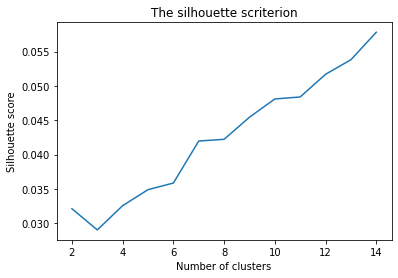

In [ ]:
plot_silhouette(sil)

We could be exploring up to 34 clusters in order to regroup the documents in themes or by pub-venue but we chose to explore 10 clusters since we are in an unsupervised process and 10 clusters is an interesting local minimum.

In [ ]:
bow_pca = sparse.csr_matrix(TruncatedSVD(n_components=300).fit_transform((normalize(bow_abstracts, norm='l1', axis=1))))
kmeans = SphericalKmeans(n_clusters=10, random_state=0)
kmeans.fit(bow_pca)
labels = np.array(kmeans.labels_)

 == New init == 
iteration: 0
6316.506946688803
iteration: 1
7696.935025708797
iteration: 2
8193.761550128775
iteration: 3
8346.77426004907
iteration: 4
8403.161332068179
iteration: 5
8425.927690515033
iteration: 6
8435.32892862749
iteration: 7
8441.966017184552
iteration: 8
8448.88715297923
iteration: 9
8455.884673280534
iteration: 10
8464.212902134728
iteration: 11
8476.589676277625
iteration: 12
8489.826092886298
iteration: 13
8502.275480052536
iteration: 14
8509.72599353657
iteration: 15
8514.166995938811
iteration: 16
8518.231081381646
iteration: 17
8522.088448764565
iteration: 18
8526.39656428833
iteration: 19
8532.132823441292


- Number of documents in each cluster

In [ ]:
pd.Series(labels).value_counts()

7    2631
6    2364
2    2145
1    2124
0    2116
3    1930
8    1917
5    1828
4    1655
9     836
dtype: int64

- Exploring 34 clusters

In [ ]:
bow_csr_matrix = sparse.csr_matrix(bow_abstracts)

In [ ]:
kmeans = SphericalKmeans(n_clusters=34, random_state=0)
kmeans.fit(bow_csr_matrix)
labels = np.array(kmeans.labels_)

 == New init == 
iteration: 0
2824.1408841202415
iteration: 1
3590.8666793229695
iteration: 2
4206.6768975189925
iteration: 3
4425.224566191085
iteration: 4
4534.18975741512
iteration: 5
4585.487848371818
iteration: 6
4615.829971459093
iteration: 7
4633.982349390387
iteration: 8
4645.4235651980025
iteration: 9
4653.360696161215
iteration: 10
4660.206795941186
iteration: 11
4665.692926504775
iteration: 12
4669.634035825157
iteration: 13
4672.777931323242
iteration: 14
4675.244399146909
iteration: 15
4677.079101648518
iteration: 16
4678.613852914177
iteration: 17
4679.724587424804
iteration: 18
4680.503800362761
iteration: 19
4681.160595759702


**b. Interpretation**

In [ ]:
from sklearn.manifold import TSNE
from sklearn.metrics import pairwise_distances
bow_csr_matrix = sparse.csr_matrix(bow_abstracts)
distance_matrix = pairwise_distances(bow_csr_matrix, bow_csr_matrix, metric='cosine', n_jobs=-1)
tsne = TSNE(n_components=2)
tsne_data = tsne.fit_transform(distance_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



- Visualization using TSNE 10 clusters

In [ ]:
fig= px.scatter(x=tsne_data[:, 0], y= tsne_data[:, 1],color=labels)

fig.show()

- Visualization using TSNE 34 clusters

In [ ]:
fig= px.scatter(x=tsne_data[:, 0], y= tsne_data[:, 1],color=labels)

fig.show()

In [ ]:
print_scores(True_labels,labels)

NMI = 0.3071561322556948
ARI = 0.14129503413798677


- Most frequent words

The centers of each cluster from the document-term representation can be calculated through the mean of each cluster BOW representation. 

The most frequent entities in each cluster is equal to the words that have the highest value in centers BOW representations.

Since the articles treats all the same global thematic, we will plot 16 last words.

In [ ]:
centers = [np.array(bow_abstracts[labels == i].mean(0)) for i in range(10)]
i_center_words = [centers[i][0,:].argsort()[-1:-16:-1] for i in range(10)]
words = [[vectorizer.get_feature_names_out()[id] for id in L] for L in i_center_words]

In [ ]:
dicts = []
for i in range(10):
  d = {}
  for j in range(len(words[i])):
      d[words[i][j]] = centers[i][0, i_center_words[i][j]]
  dicts.append(d)

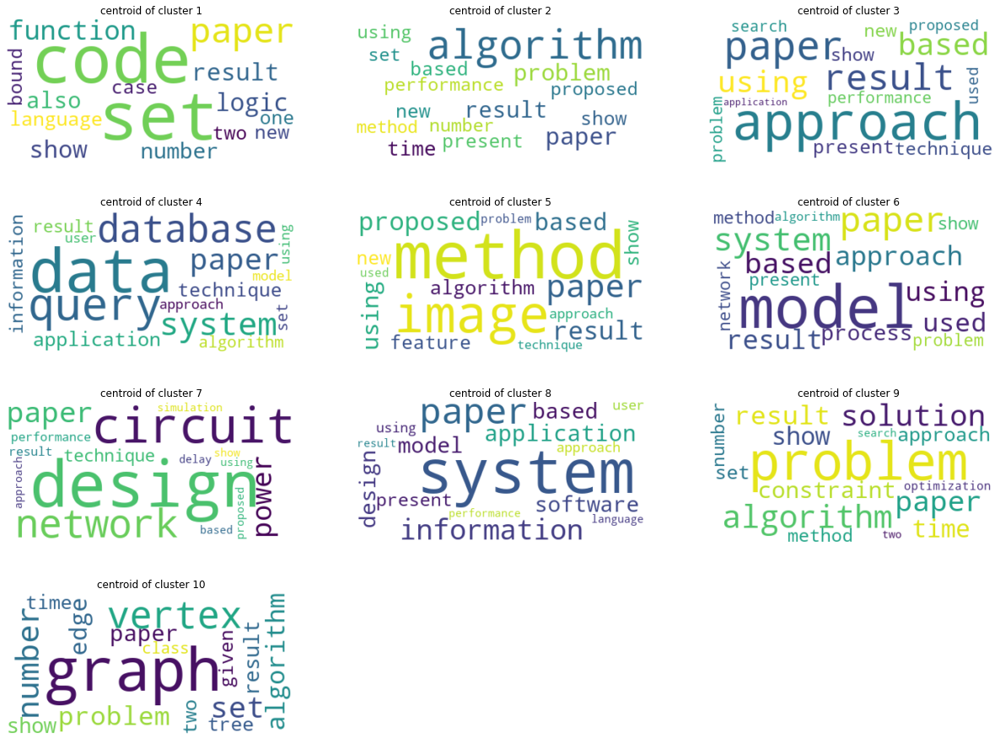

In [ ]:
f = plt.figure(figsize=(21, 16))

for i in range(10):
  wc = WordCloud(background_color="white").generate_from_frequencies(dicts[i])
  plt.subplot(4, 3, i+1)
  plt.imshow(wc, interpolation="bilinear")
  plt.axis("off")
  plt.title('centroid of cluster %d' % (i+1))

- Reviews type for each cluster:

In [ ]:
L = []
for i in range(10):
  L.append(data_parsed[labels==i].groupby('pub_venue').apply(len).sort_values(ascending=False)[:5])

In [ ]:
for i in range(10):
  fig = px.bar(x = L[i].index, 
              y = L[i])

  fig.update_layout(
      title={"text": "Cluster %d" % (i+1), 'x':0.5},
      xaxis_title="number of references",
      yaxis_title="number of articles",
  )

  fig.show()

- year distribution for each cluster:

In [ ]:
L = []
for i in range(10):
  L.append(data_parsed[labels==i].groupby('year').apply(len).sort_values(ascending=False)[:5])

In [ ]:
for i in range(10):
  fig = px.bar(x = L[i].index, 
              y = L[i])

  fig.update_layout(
      title={"text": "Cluster %d" % (i+1), 'x':0.5},
      xaxis_title="number of references",
      yaxis_title="number of articles",
  )

  fig.show()

- Number of references distribution for each cluster

In [ ]:
L = []
for i in range(10):
  L.append(data_parsed[labels==i].groupby('refs_count').apply(len).sort_values(ascending=False))

In [ ]:
for i in range(10):
  fig = px.bar(x = L[i].index, 
              y = L[i])

  fig.update_layout(
      title={"text": "Cluster %d" % (i+1), 'x':0.5},
      xaxis_title="number of references",
      yaxis_title="number of articles",
  )

  fig.show()

#### **2. K-means on document-entity matrix**

**a. Application**

In [ ]:
sil = silhouette(docEntitiesMatrix, spherical=False)

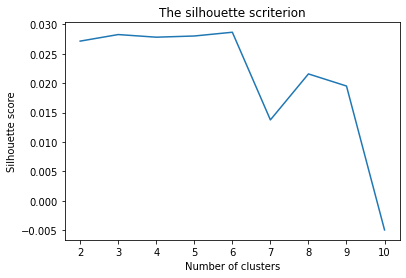

In [ ]:
plot_silhouette(sil)

In [ ]:
from scipy.sparse import csr_matrix
sparse_entity = csr_matrix(docEntitiesMatrix)
kmeans = KMeans(n_clusters = 34, init = 'random', random_state = 42)
kmeans.fit(sparse_entity)
labels = np.array(kmeans.labels_)

**b. Interpretation**

- TSNE

In [ ]:
from sklearn.manifold import TSNE
nb = sparse_entity.shape[0]
tsne = TSNE(n_components=2)
tsne_data = tsne.fit_transform(sparse_entity[0:nb,:])
fig= px.scatter(x=tsne_data[:, 0], y= tsne_data[:, 1],color=labels)

fig.show()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [ ]:
print_scores(True_labels,labels)

NMI = 0.10738922243463396
ARI = 0.03641361211625835


- Most frequent words

The centers of each cluster from the document-entities representation can be calculated through the mean of each cluster BOW representation. 

The most frequent entities in each cluster is equal to the words that have the highest value in centers BOW representations.

In [ ]:
centers = [np.array(sparse_entity[kmeans.labels_ == i].mean(0)) for i in range(34)]
i_center_words = [centers[i][0,:].argsort()[-1:-16:-1] for i in range(34)]
words = [vectorizer.get_feature_names_out()[i] for i in i_center_words]

In [ ]:
dicts = []
for i in range(34):
  d = {}
  for j in range(len(words[i])):
      d[words[i][j]] = centers[i][0, i_center_words[i][j]]
  dicts.append(d)

ValueError: ignored

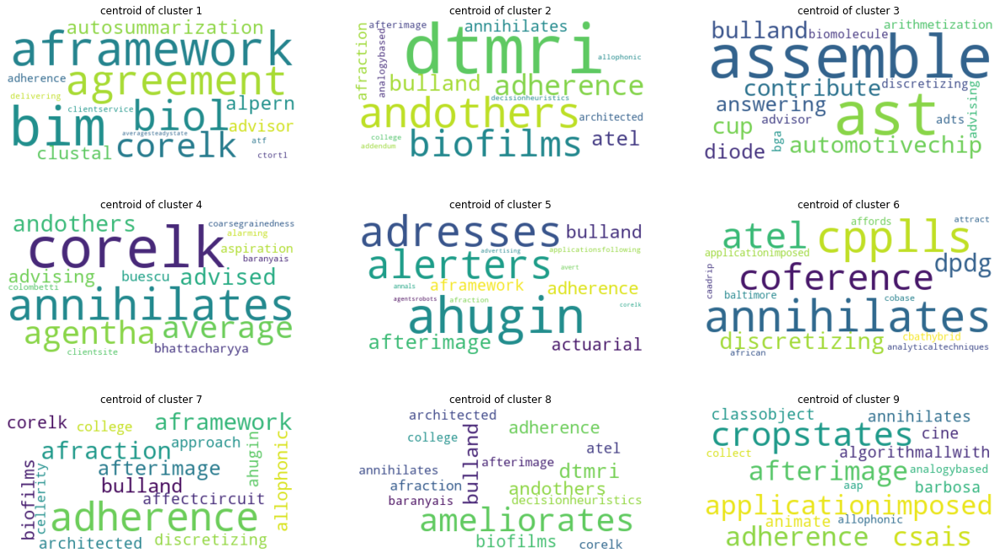

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
f = plt.figure(figsize=(21, 12))

for i in range(12):
  wc = WordCloud(background_color="white").generate_from_frequencies(dicts[i])
  plt.subplot(3, 3, i+1)
  plt.imshow(wc, interpolation="bilinear")
  plt.axis("off")
  plt.title('centroid of cluster %d' % (i+1))

- Reviews type for each cluster:

In [ ]:
L = []
for i in range(34):
  L.append(data_parsed[labels==i].groupby('pub_venue').apply(len).sort_values(ascending=False)[:5])

In [ ]:
for i in range(34):
  fig = px.bar(x = L[i].index, 
              y = L[i])

  fig.update_layout(
      title={"text": "Cluster %d" % (i+1), 'x':0.5},
      xaxis_title="number of references",
      yaxis_title="number of articles",
  )

  fig.show()

- year distribution for each cluster:

In [ ]:
L = []
for i in range(34):
  L.append(data_parsed[labels==i].groupby('year').apply(len).sort_values(ascending=False)[:5])

In [ ]:
for i in range(34):
  fig = px.bar(x = L[i].index, 
              y = L[i])

  fig.update_layout(
      title={"text": "Cluster %d" % (i+1), 'x':0.5},
      xaxis_title="number of references",
      yaxis_title="number of articles",
  )

  fig.show()

- Number of references distribution for each cluster

In [ ]:
L = []
for i in range(6):
  L.append(data_parsed[kmeans.labels_==i].groupby('refs_count').apply(len).sort_values(ascending=False))

In [ ]:
for i in range(34):
  fig = px.bar(x = L[i].index, 
              y = L[i])

  fig.update_layout(
      title={"text": "Cluster %d" % (i+1), 'x':0.5},
      xaxis_title="number of references",
      yaxis_title="number of articles",
  )

  fig.show()

#### **4. Spherical K-means on document-entity matrix**

**a. Application**

- Choix du nombre de cluster based on Silhouette score.

In [ ]:
sil = silhouette(docEntitiesMatrix)

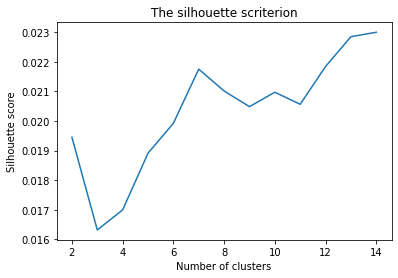

In [ ]:
plot_silhouette(sil)

We could be exploring up to 34 clusters in order to regroup the documents in themes or by pub-venue but we chose to explore 7 clusters since we are in an unsupervised process and 7 clusters is an interesting local minimum.

In [ ]:
sparse_dtm = sparse.csr_matrix(docEntitiesMatrix)
kmeans = SphericalKmeans(n_clusters=7, random_state=0)
kmeans.fit(sparse_dtm)
labels = np.array(kmeans.labels_)

 == New init == 
iteration: 0
2677.484306539307
iteration: 1
2949.1523192597188
iteration: 2
3131.4773407337875
iteration: 3
3256.4870826472416
iteration: 4
3322.0332094661144
iteration: 5
3350.0309770588674
iteration: 6
3364.6211391487773
iteration: 7
3374.288677124105
iteration: 8
3382.1449330077317
iteration: 9
3390.246566374535
iteration: 10
3400.601659923187
iteration: 11
3408.0094735191333
iteration: 12
3410.736144700451
iteration: 13
3412.0367455864803
iteration: 14
3412.7767432795213
iteration: 15
3413.206301309119
iteration: 16
3413.45911582815
iteration: 17
3413.6349823459927
iteration: 18
3413.7528484720697
iteration: 19
3413.8260856102493


- Number of documents in each cluster

In [ ]:
pd.Series(labels).value_counts()

1    4570
5    3779
4    2575
2    2538
6    2482
3    2092
0    1510
dtype: int64

**b. Interpretation**

- Most frequent words

The centers of each cluster from the document-entities representation can be calculated through the mean of each cluster BOW representation. 

The most frequent entities in each cluster is equal to the words that have the highest value in centers BOW representations.

Since the articles treats all the same global thematic, we will plot 16 words stating from [-56 à -40] (list python indexing and ordered by their occurence value which is the mean of the clusters words occurences).

In [ ]:
centers = [np.array(sparse_dtm[labels == i].mean(0)) for i in range(7)]
i_center_words = [centers[i][0,:].argsort()[-40:-56:-1] for i in range(7)]
words = [[entitiesWords[unique_entities[id]] for id in L] for L in i_center_words]

In [ ]:
dicts = []
for i in range(7):
  d = {}
  for j in range(len(words[i])):
      d[words[i][j]] = centers[i][0, i_center_words[i][j]]
  dicts.append(d)

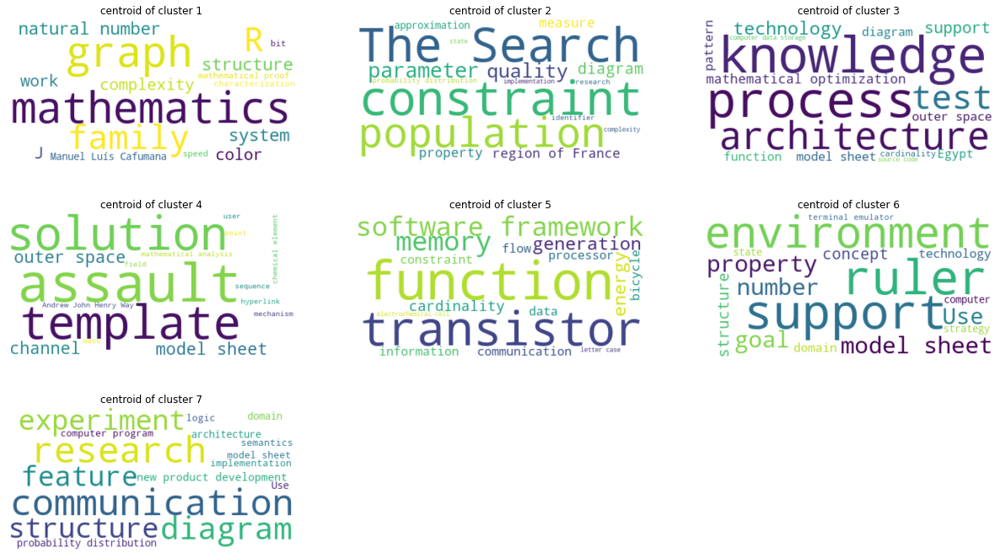

In [ ]:
f = plt.figure(figsize=(21, 12))

for i in range(7):
  wc = WordCloud(background_color="white").generate_from_frequencies(dicts[i])
  plt.subplot(3, 3, i+1)
  plt.imshow(wc, interpolation="bilinear")
  plt.axis("off")
  plt.title('centroid of cluster %d' % (i+1))

- Reviews type for each cluster:

In [ ]:
L = []
for i in range(7):
  L.append(data_parsed[labels==i].groupby('pub_venue').apply(len).sort_values(ascending=False)[:5])

In [ ]:
for i in range(7):
  fig = px.bar(x = L[i].index, 
              y = L[i])

  fig.update_layout(
      title={"text": "Cluster %d" % (i+1), 'x':0.5},
      xaxis_title="number of references",
      yaxis_title="number of articles",
  )

  fig.show()

- year distribution for each cluster:

In [ ]:
L = []
for i in range(7):
  L.append(data_parsed[labels==i].groupby('year').apply(len).sort_values(ascending=False)[:5])

In [ ]:
for i in range(7):
  fig = px.bar(x = L[i].index, 
              y = L[i])

  fig.update_layout(
      title={"text": "Cluster %d" % (i+1), 'x':0.5},
      xaxis_title="number of references",
      yaxis_title="number of articles",
  )

  fig.show()

- Number of references distribution for each cluster

In [ ]:
L = []
for i in range(7):
  L.append(data_parsed[labels==i].groupby('refs_count').apply(len).sort_values(ascending=False))

In [ ]:
for i in range(7):
  fig = px.bar(x = L[i].index, 
              y = L[i])

  fig.update_layout(
      title={"text": "Cluster %d" % (i+1), 'x':0.5},
      xaxis_title="number of references",
      yaxis_title="number of articles",
  )

  fig.show()